In [4]:
import pandas as pd
import os
import subprocess
from typing import List, Dict, Tuple
import calplot
import matplotlib.colors as mcolors
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

In [5]:
path = r"C:\Users\michw\IoT\data\output.parquet"

df = pd.read_parquet(path)
df = df.drop(columns=['snr', 'WIFI', 'BLE', 'rssi', 'channel_rssi', 'gateway', 'channel_index', 'spreading_factor', 'bandwidth', 'f_cnt', 'device_id'])
print(df)

                 date_time    tmp    hum  CO2   VOC  vis  IR room  floor
0      2023-03-18 00:13:10  19.80  38.14  424  1032    6   0  214      2
1      2023-03-18 00:28:19  19.80  38.18  423   999    6   0  214      2
2      2023-03-18 00:43:25  19.80  38.18  423   970    6   0  214      2
3      2023-03-18 00:58:31  19.78  38.24  417   817    6   2  214      2
4      2023-03-18 01:13:38  19.81  38.31  426   883    6   0  214      2
...                    ...    ...    ...  ...   ...  ...  ..  ...    ...
282015 2023-04-15 20:43:02  20.90  42.05  421  1026    5   0  113      1
282016 2023-04-15 21:29:16  20.88  42.57  425  1152    7   2  113      1
282017 2023-04-15 22:30:29  20.84  42.18  430  1342    5   0  113      1
282018 2023-04-15 23:01:16  20.83  42.57  434  1266    7   2  113      1
282019 2023-04-15 23:16:36  20.81  42.77  428  1420    5   0  113      1

[282020 rows x 9 columns]


---

# Anzahl Einträge für floor 3 pro Raum

In [6]:
df_floor3 = df[df['floor'] == 3]

# Anzahl der Datensätze pro Raum zählen
room_counts = df_floor3['room'].value_counts()

print(room_counts)

room
311    11890
308     8591
Name: count, dtype: int64


---

In [7]:
temps_floor3_2022 = df[(df['floor'] == 3) & (df['date_time'].dt.year == 2022)]
numeric_df_2022 = temps_floor3_2022.select_dtypes(include=[np.number])
numeric_df_2022['date_time'] = temps_floor3_2022['date_time']
daily_avg_temp_2022 = numeric_df_2022.resample('D', on='date_time').mean().reset_index()

In [8]:
fig = px.line(daily_avg_temp_2022, x='date_time', y='tmp', title='Täglicher Durchschnitt der Temperatur im Jahr 2022',
              labels={'date_time': 'Datum', 'tmp': 'Durchschnittliche Temperatur (°C)'})

fig.show()

In [9]:
temps_floor3_2023 = df[(df['floor'] == 3) & (df['date_time'].dt.year == 2023)]
numeric_df_2023 = temps_floor3_2023.select_dtypes(include=[np.number])
numeric_df_2023['date_time'] = temps_floor3_2023['date_time']
daily_avg_temp_2023 = numeric_df_2023.resample('D', on='date_time').mean().reset_index()

In [10]:
fig = px.line(daily_avg_temp_2023, x='date_time', y='tmp', title='Täglicher Durchschnitt der Temperatur im Jahr 2023',
              labels={'date_time': 'Datum', 'tmp': 'Durchschnittliche Temperatur (°C)'})

fig.show()

---

In [11]:
hum_floor3_2022 = df[(df['floor'] == 3) & (df['date_time'].dt.year == 2022)]
numeric_df_2022 = temps_floor3_2022.select_dtypes(include=[np.number])
numeric_df_2022['date_time'] = hum_floor3_2022['date_time']
daily_avg_hum_2022 = numeric_df_2022.resample('D', on='date_time').mean().reset_index()

In [12]:
fig = px.line(daily_avg_hum_2022, x='date_time', y='hum', title='Täglicher Durchschnitt der Luftfeuchtigkeit im Jahr 2022',
              labels={'date_time': 'Datum', 'hum': 'Durchschnittliche Luftfeuchtigkeit'})

fig.show()

In [13]:
hum_floor3_2023 = df[(df['floor'] == 3) & (df['date_time'].dt.year == 2023)]
numeric_df_2023 = hum_floor3_2023.select_dtypes(include=[np.number])
numeric_df_2023['date_time'] = hum_floor3_2023['date_time']
daily_avg_hum_2023 = numeric_df_2023.resample('D', on='date_time').mean().reset_index()

In [14]:
fig = px.line(daily_avg_hum_2023, x='date_time', y='hum', title='Täglicher Durchschnitt der Luftfeuchtigkeit im Jahr 2023',
              labels={'date_time': 'Datum', 'hum': 'Durchschnittliche Luftfeuchtigkeit'})

fig.show()

---

In [15]:
co2_floor3_2022 = df[(df['floor'] == 3) & (df['date_time'].dt.year == 2022)]
numeric_df_2022 = co2_floor3_2022.select_dtypes(include=[np.number])
numeric_df_2022['date_time'] = co2_floor3_2022['date_time']
daily_avg_co2_2022 = numeric_df_2022.resample('D', on='date_time').mean().reset_index()

In [16]:
fig = px.line(daily_avg_co2_2022, x='date_time', y='CO2', title='Täglicher Durchschnitt des CO2 Wert im Jahr 2023',
              labels={'date_time': 'Datum', 'CO2': 'Durchschnittlich CO2'})

fig.show()

In [17]:
co2_floor3_2023 = df[(df['floor'] == 3) & (df['date_time'].dt.year == 2023)]
numeric_df_2023 = co2_floor3_2023.select_dtypes(include=[np.number])
numeric_df_2023['date_time'] = co2_floor3_2023['date_time']
daily_avg_co2_2023 = numeric_df_2023.resample('D', on='date_time').mean().reset_index()

In [18]:
fig = px.line(daily_avg_co2_2023, x='date_time', y='CO2', title='Täglicher Durchschnitt des CO2 Wert im Jahr 2023',
              labels={'date_time': 'Datum', 'CO2': 'Durchschnittlich CO2'})

fig.show()

---

In [19]:
voc_floor3_2022 = df[(df['floor'] == 3) & (df['date_time'].dt.year == 2022)]
numeric_df_2022 = voc_floor3_2022.select_dtypes(include=[np.number])
numeric_df_2022['date_time'] = voc_floor3_2022['date_time']
daily_avg_voc_2022 = numeric_df_2022.resample('D', on='date_time').mean().reset_index()

In [20]:
fig = px.line(daily_avg_voc_2022, x='date_time', y='VOC', title='Täglicher Durchschnitt des VOC Wert im Jahr 2022',
              labels={'date_time': 'Datum', 'VOC': 'Durchschnittlich VOC'})

fig.show()

In [21]:
voc_floor3_2023 = df[(df['floor'] == 3) & (df['date_time'].dt.year == 2023)]
numeric_df_2023 = voc_floor3_2023.select_dtypes(include=[np.number])
numeric_df_2023['date_time'] = voc_floor3_2023['date_time']
daily_avg_voc_2023 = numeric_df_2023.resample('D', on='date_time').mean().reset_index()

In [22]:
fig = px.line(daily_avg_voc_2023, x='date_time', y='VOC', title='Täglicher Durchschnitt des VOC Wert im Jahr 2023',
              labels={'date_time': 'Datum', 'VOC': 'Durchschnittlich VOC'})

fig.show()

---

In [23]:
vis_floor3_2022 = df[(df['floor'] == 3) & (df['date_time'].dt.year == 2022)]
numeric_df_2022 = vis_floor3_2022.select_dtypes(include=[np.number])
numeric_df_2022['date_time'] = vis_floor3_2022['date_time']
daily_avg_vis_2022 = numeric_df_2022.resample('D', on='date_time').mean().reset_index()

In [24]:
fig = px.line(daily_avg_vis_2022, x='date_time', y='vis', title='Täglicher Durchschnitt des vic Wert im Jahr 2022',
              labels={'date_time': 'Datum', 'vis': 'Durchschnittlich vis'})

fig.show()

In [25]:
vis_floor3_2023 = df[(df['floor'] == 3) & (df['date_time'].dt.year == 2023)]
numeric_df_2022 = vis_floor3_2022.select_dtypes(include=[np.number])
numeric_df_2023['date_time'] = vis_floor3_2023['date_time']
daily_avg_vis_2023 = numeric_df_2023.resample('D', on='date_time').mean().reset_index()

In [26]:
fig = px.line(daily_avg_vis_2023, x='date_time', y='vis', title='Täglicher Durchschnitt des vic Wert im Jahr 2023',
              labels={'date_time': 'Datum', 'vis': 'Durchschnittlich vis'})

fig.show()

---

In [27]:
ir_floor3_2022 = df[(df['floor'] == 3) & (df['date_time'].dt.year == 2022)]
numeric_df_2022 = ir_floor3_2022.select_dtypes(include=[np.number])
numeric_df_2022['date_time'] = ir_floor3_2022['date_time']
daily_avg_ir_2022 = numeric_df_2022.resample('D', on='date_time').mean().reset_index()

In [28]:
fig = px.line(daily_avg_ir_2022, x='date_time', y='IR', title='Täglicher Durchschnitt des IR Wert im Jahr 2022',
              labels={'date_time': 'Datum', 'vis': 'Durchschnittlich IR'})

fig.show()

In [29]:
ir_floor3_2023 = df[(df['floor'] == 3) & (df['date_time'].dt.year == 2023)]
numeric_df_2023 = ir_floor3_2023.select_dtypes(include=[np.number])
numeric_df_2023['date_time'] = ir_floor3_2023['date_time']
daily_avg_ir_2023 = numeric_df_2023.resample('D', on='date_time').mean().reset_index()

In [30]:
fig = px.line(daily_avg_ir_2023, x='date_time', y='IR', title='Täglicher Durchschnitt des IR Wert im Jahr 2022',
              labels={'date_time': 'Datum', 'vis': 'Durchschnittlich IR'})

fig.show()

---

In [31]:
temps_floor3 = df[(df['floor'] == 3)]

temp3 = px.scatter(temps_floor3, x='room', y='tmp', color='room', hover_data=['date_time'], labels={'room': 'Room', 'tmp': 'Temperature'}, title='Temperatures for Floor 3')

temp3.update_layout(
    xaxis_title='Room',
    yaxis_title='Temperature',
    hovermode='closest'
)

temp3.show()

In [32]:
hum_floor3 = df[(df['floor'] == 3)]

hum3 = px.scatter(hum_floor3, x='room', y='hum', color='room', hover_data=['date_time'], labels={'room': 'Room', 'hum': 'Humidity'}, title='Humidity for Floor 3')

hum3.update_layout(
    xaxis_title='Room',
    yaxis_title='Humidity (%)',
    hovermode='closest'
)

hum3.show()

In [33]:
CO2_floor3 = df[(df['floor'] == 3)]

co23 = px.scatter(CO2_floor3, x='room', y='CO2', color='room', hover_data=['date_time'], labels={'room': 'Room', 'CO2': 'CO2'}, title='CO2 for Floor 3')

co23.update_layout(
    xaxis_title='Room',
    yaxis_title='CO2 (%)',
    hovermode='closest'
)

co23.show()

In [34]:
VOC_floor3 = df[(df['floor'] == 3)]

voc3 = px.scatter(VOC_floor3, x='room', y='VOC', color='room', hover_data=['date_time'], labels={'room': 'Room', 'VOC': 'VOC'}, title='VOC for Floor 3')

voc3.update_layout(
    xaxis_title='Room',
    yaxis_title='VOC',
    hovermode='closest'
)

voc3.show()

In [35]:
vis_floor3 = df[(df['floor'] == 3)]

vis3 = px.scatter(vis_floor3, x='room', y='vis', color='room', hover_data=['date_time'], labels={'room': 'Room', 'vis': 'vis'}, title='vis for Floor 3')

vis3.update_layout(
    xaxis_title='Room',
    yaxis_title='vis',
    hovermode='closest'
)

vis3.show()

In [36]:
IR_floor3 = df[(df['floor'] == 3)]

ir3 = px.scatter(IR_floor3, x='room', y='IR', color='room', hover_data=['date_time'], labels={'room': 'Room', 'IR': 'IR'}, title='IR for Floor 3')

ir3.update_layout(
    xaxis_title='Room',
    yaxis_title='IR',
    hovermode='closest'
)

ir3.show()

---

In [37]:
floor3 = df[(df['floor'] == 3)]
df2 = floor3.drop(columns=["date_time", "room", "floor"])
correlation_matrix = df2.corr()

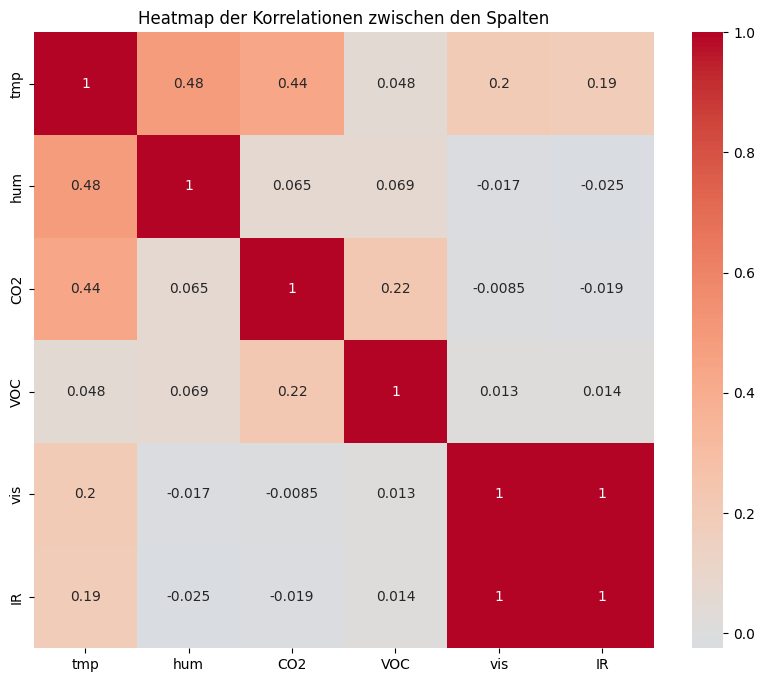

In [38]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap der Korrelationen zwischen den Spalten')
plt.show()

---

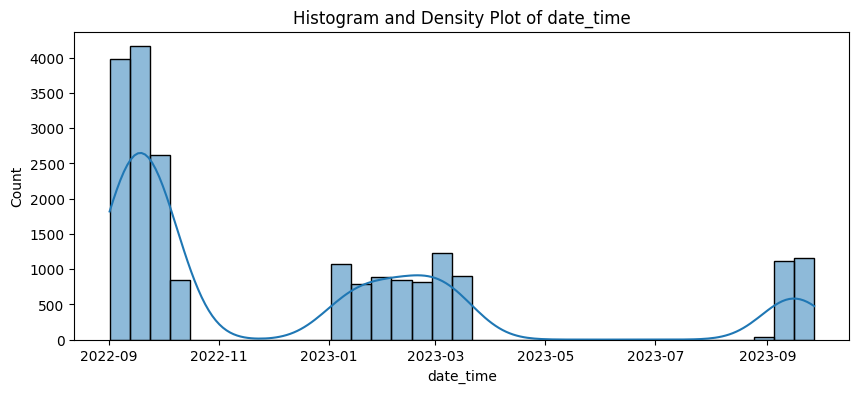

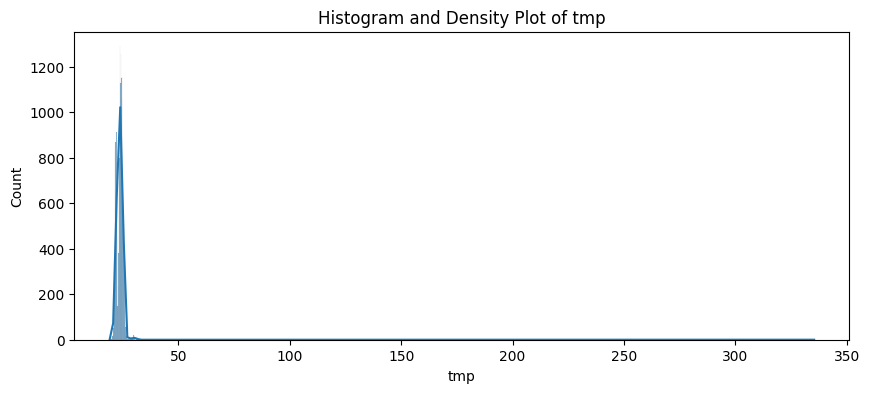

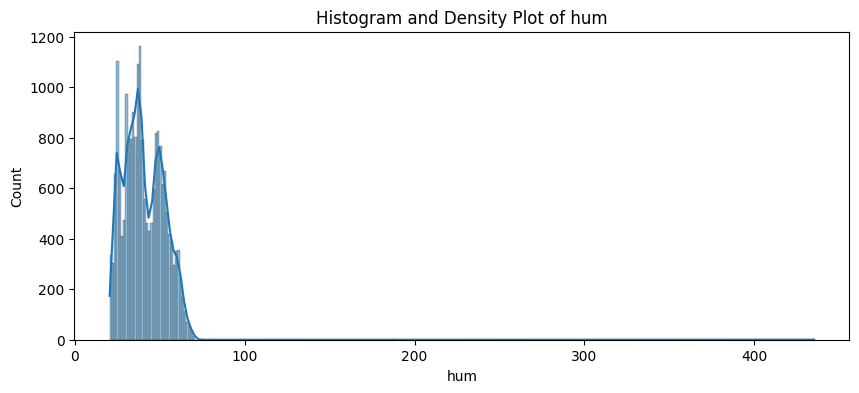

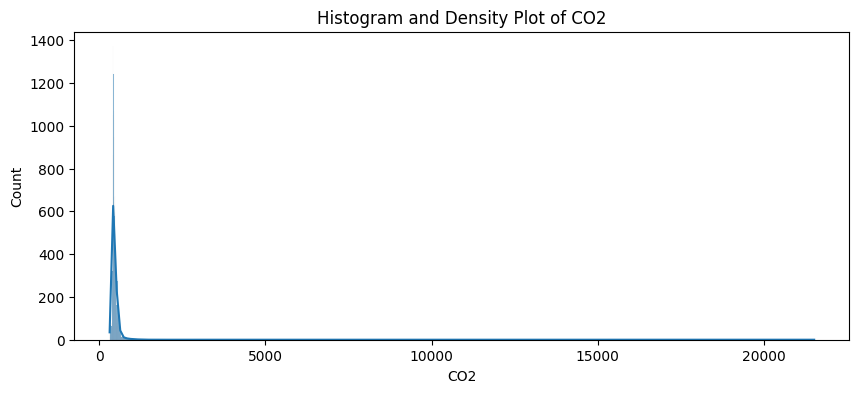

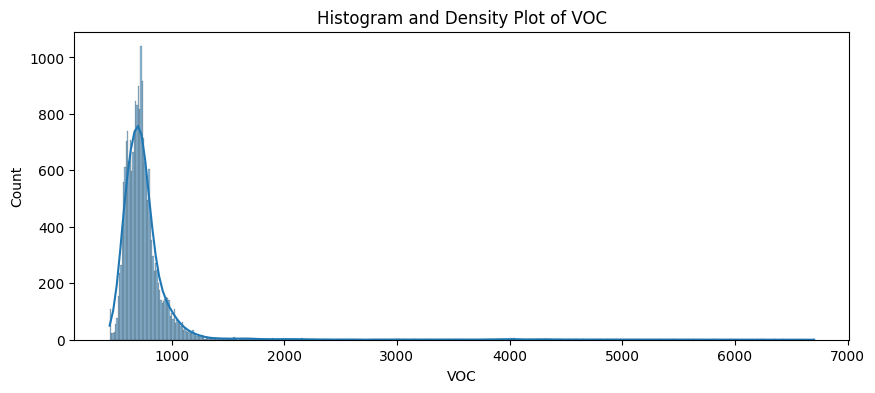

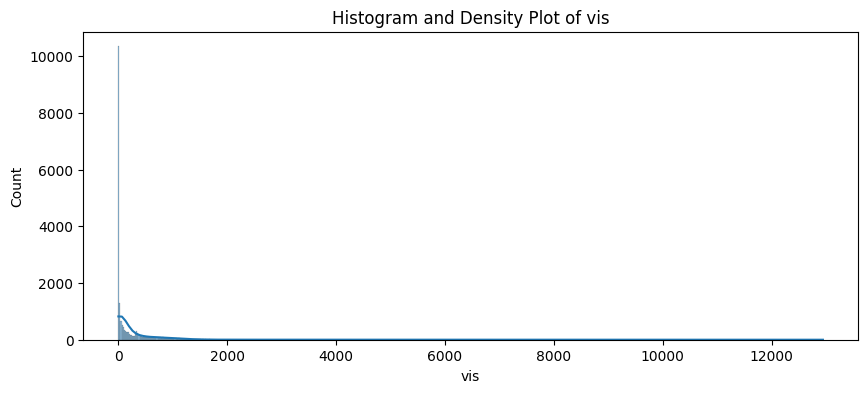

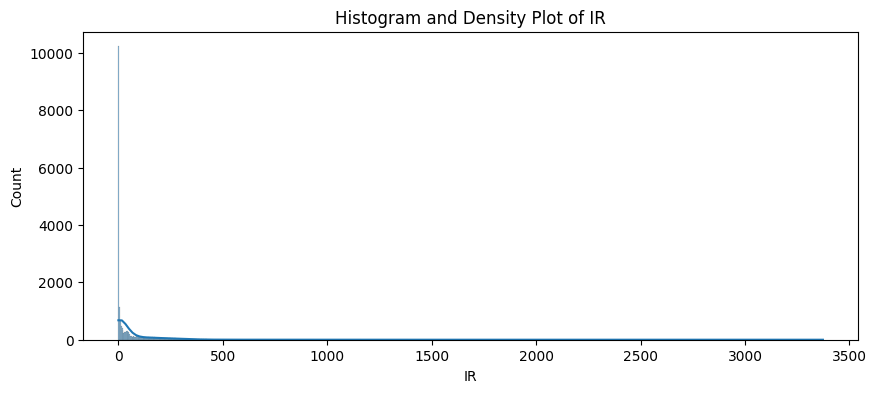

In [41]:
df3 = df_floor3.drop(columns=['room', 'floor'])

for column in df3.columns:
    plt.figure(figsize=(10, 4))
    sns.histplot(df3[column], kde=True)
    plt.title(f'Histogram and Density Plot of {column}')
    plt.show()